In [1]:
import os
import sys
import dotenv
import yaml
import json

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set up paths
project_dir = os.getenv('PROJECT_DIR')
dotenv_path = os.path.join(project_dir, '.env')
dotenv.load_dotenv(dotenv_path)
    
sys.path.append(project_dir)

In [2]:
from config import Config
config = Config()

In [3]:
from src.visualization.visualize import DistributionVisualizer, ImageVisualizer, plot_confusion_matrices
from src.pipeline import DataPipeline, ModelPredictionPipeline, ModelEvaluationPipeline
from src.data.make_dataset import DatasetHandler
from model_config import model_selector, params_files, train_results_files, preds_files, evals_files
from src.my_utils import load_files, extract_metric_from_results

c:\Users\delst\anaconda3\envs\cv-model-compare\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


---

In [4]:
raw_data_path = 'C:/Users/delst/Data_Vault/Intel_Image_CNN'
data_path = os.path.join(config.data_dir, 'raw/intel_image_paths_labels.parq')

In [5]:
dataset_handler = DatasetHandler(data_path)
df, df_train, df_test, df_pred = dataset_handler.get_datasets()

In [6]:
data_pipeline = DataPipeline(raw_data_path, data_path)
data_pipeline.run()

In [7]:
# Predictions
prediction_pipeline = ModelPredictionPipeline(model_selector, data_pipeline.test_loader)
prediction_pipeline.run()

Getting predictions for CNN...
Saved predictions for CNN at C:\Users\delst\OneDrive\Desktop\Code\Workspace\CV_Model_Compare\models\preds/CNN_Intel_predictions.json.
Completed predictions for CNN.
----------------------------------------
Getting predictions for EN...
Saved predictions for EN at C:\Users\delst\OneDrive\Desktop\Code\Workspace\CV_Model_Compare\models\preds/EN_Intel_predictions.json.
Completed predictions for EN.
----------------------------------------
Getting predictions for EN_PT...
Saved predictions for EN_PT at C:\Users\delst\OneDrive\Desktop\Code\Workspace\CV_Model_Compare\models\preds/EN_PT_Intel_predictions.json.
Completed predictions for EN_PT.
----------------------------------------
Getting predictions for RN_PT...
Saved predictions for RN_PT at C:\Users\delst\OneDrive\Desktop\Code\Workspace\CV_Model_Compare\models\preds/RN_PT_Intel_predictions.json.
Completed predictions for RN_PT.
----------------------------------------


---

# **Visualise Raw Data**

In [8]:
distributions = DistributionVisualizer(df, df_train, df_test, df_pred)
distributions.dataset_distributions()

Segment
seg_train    14034
seg_pred      7301
seg_test      3000
Name: count, dtype: int64
{'train': Category
mountain     0.178994
glacier      0.171298
street       0.169731
sea          0.162035
forest       0.161821
buildings    0.156121
Name: proportion, dtype: float64, 'test': Category
glacier      0.184333
mountain     0.175000
sea          0.170000
street       0.167000
forest       0.158000
buildings    0.145667
Name: proportion, dtype: float64, 'pred': Category
seg_pred    1.0
Name: proportion, dtype: float64}


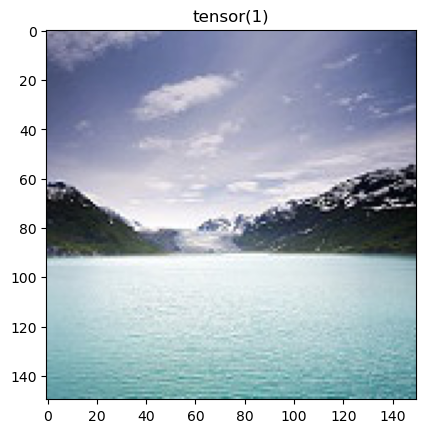

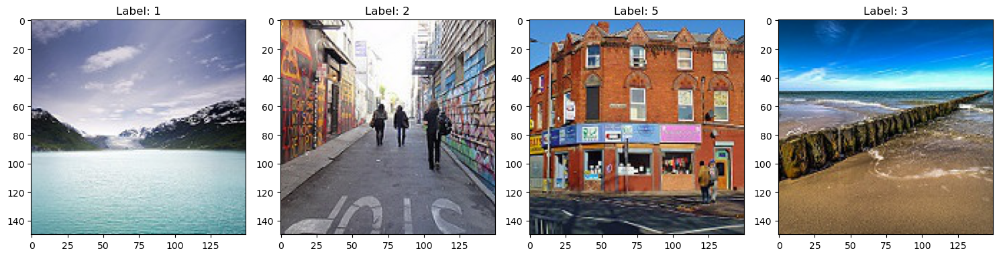

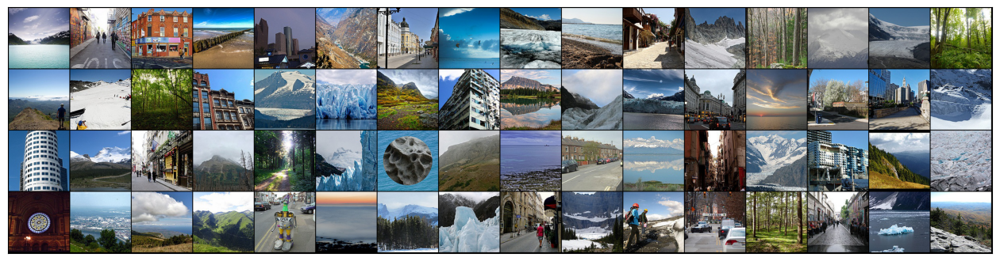

In [9]:
visualiser = ImageVisualizer(data_pipeline.train_loader)
visualiser.display_single_image()
visualiser.display_batch_images()
visualiser.show_batch()

---

# **Load Results**

In [10]:
train_metrics = load_files(train_results_files)
pred_metrics = load_files(preds_files)
eval_metrics = load_files(evals_files)

In [11]:
# /train_results
val_loss = extract_metric_from_results(train_metrics, 'val_loss')
train_loss = extract_metric_from_results(train_metrics, 'train_loss')
val_acc = extract_metric_from_results(train_metrics, 'val_acc')

# /preds
preds = extract_metric_from_results(pred_metrics, 'predictions')
labels = extract_metric_from_results(pred_metrics, 'true_labels')

# /evals
performance = extract_metric_from_results(eval_metrics, 'Performance Metrics')
accuracies = extract_metric_from_results(eval_metrics, 'Class Accuracy Metrics')
efficiency = extract_metric_from_results(eval_metrics, 'Computational Metrics')
complexity = extract_metric_from_results(eval_metrics, 'Complexity Metrics')

---

# **Visualise Results**

In [12]:
# replace val_loss outliers with NaN, then fill with ffill
val_loss = val_loss.mask(val_loss > 1.5, np.nan, axis=0)
val_loss.fillna(method='ffill', axis=0, inplace=True)

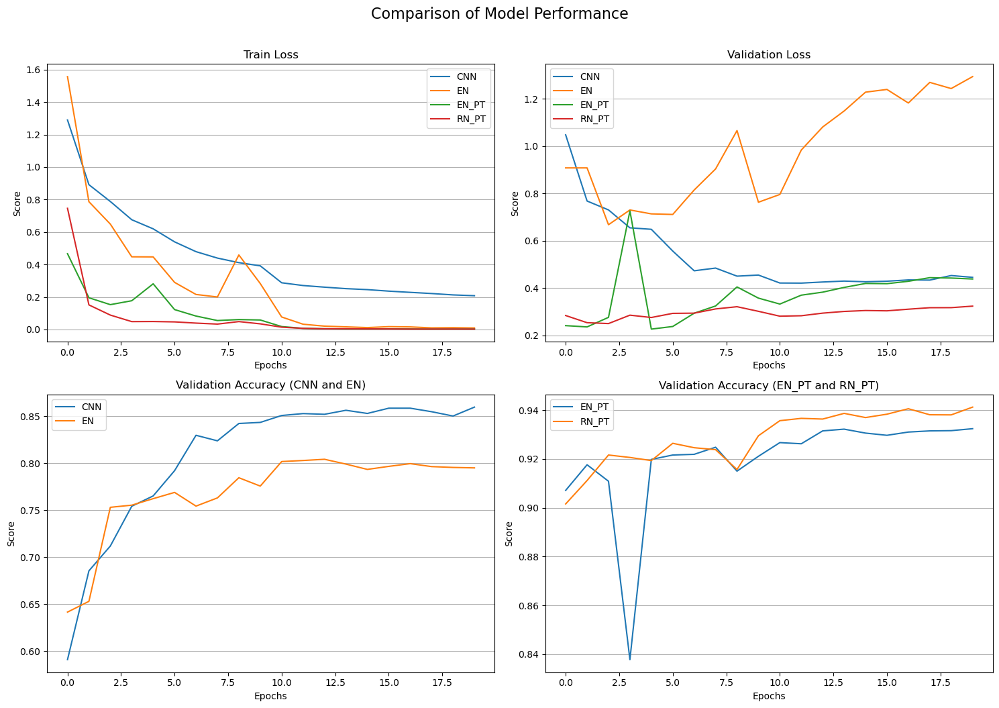

In [13]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Data and corresponding titles for each subplot
data = [
    train_loss,
    val_loss,
    val_acc[['CNN', 'EN']],
    val_acc[['EN_PT', 'RN_PT']]
    ]

titles = [
    'Train Loss',
    'Validation Loss',
    'Validation Accuracy (CNN and EN)',
    'Validation Accuracy (EN_PT and RN_PT)'
    ]

for ax, d, title in zip(axes.ravel(), data, titles):
    ax.plot(d)
    ax.set_title(title)
    ax.set_ylabel('Score')
    ax.set_xlabel('Epochs')
    ax.grid(axis='y')
    ax.legend(d.columns)

plt.tight_layout()
plt.suptitle('Comparison of Model Performance', fontsize=16, y=1.05)
plt.show()


---

# **Evaluation Metrics**

### **Performance**

In [14]:
performance

,CNN,EN,EN_PT,RN_PT
F1 Score,0.860828,0.797004,0.933434,0.942383
Precision,0.861011,0.797995,0.933453,0.941914
Recall,0.861062,0.796484,0.934017,0.943021
Accuracy,0.860000,0.795000,0.932333,0.941333


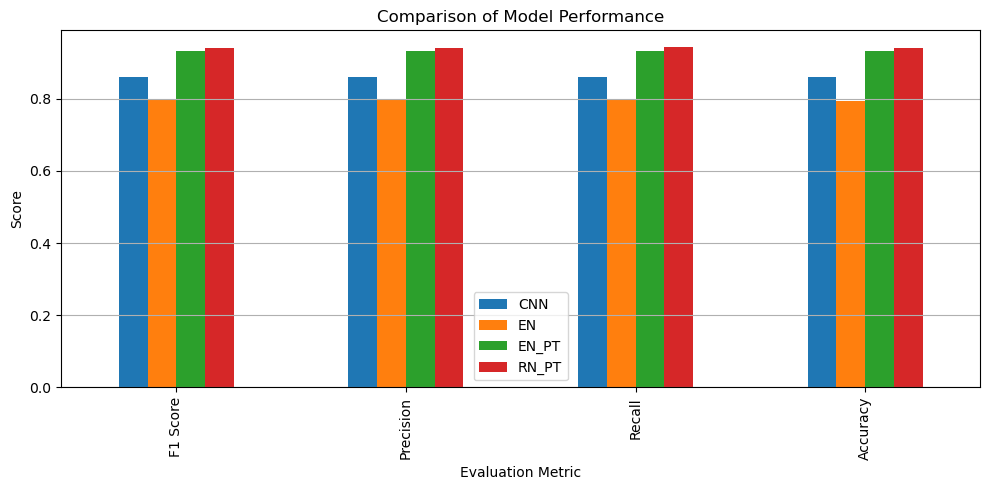

In [15]:
performance.plot(kind='bar', figsize=(10, 5))
plt.title('Comparison of Model Performance')
plt.ylabel('Score')
plt.xlabel('Evaluation Metric')
plt.grid(axis='y')

plt.tight_layout()

---

### **Accuracies**

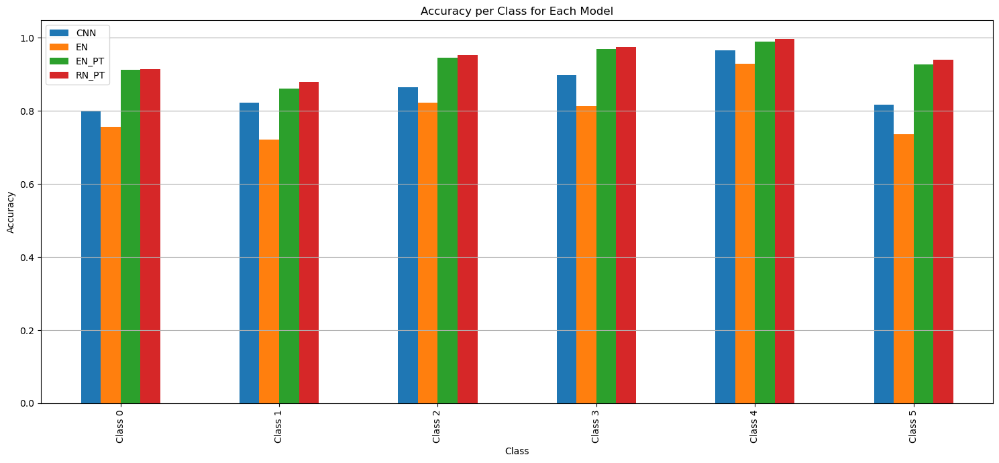

In [16]:
# Plot the data
accuracies.plot(kind='bar', figsize=(15, 7))

plt.title('Accuracy per Class for Each Model')
plt.ylabel('Accuracy')
plt.xlabel('Class')
plt.grid(axis='y')

plt.tight_layout()
plt.show()

---

### **Computational Efficiency**

In [17]:
efficiency = efficiency.T
complexity = complexity.T

In [18]:
efficiency['Accuracy'] = complexity['Accuracy']
efficiency['Computational Resource Ratio'] = efficiency['Inference Time'] / efficiency['Total Parameters'] # Lower = Faster computation per parameter
efficiency['Computational Complexity Ratio'] = efficiency['Accuracy'] / efficiency['Total Parameters'] # Higher = Better accuracy per parameter

In [19]:
efficiency

,Inference Time,Total Parameters,Accuracy,Computational Resource Ratio,Computational Complexity Ratio
CNN,7.455023,86589638.0,0.860000,8.609601e-08,9.931904e-09
EN,4.689530,4015234.0,0.795000,1.167934e-06,1.979959e-07
EN_PT,5.635665,4015234.0,0.932333,1.403571e-06,2.321990e-07
RN_PT,6.991542,25557032.0,0.941333,2.735663e-07,3.683265e-08


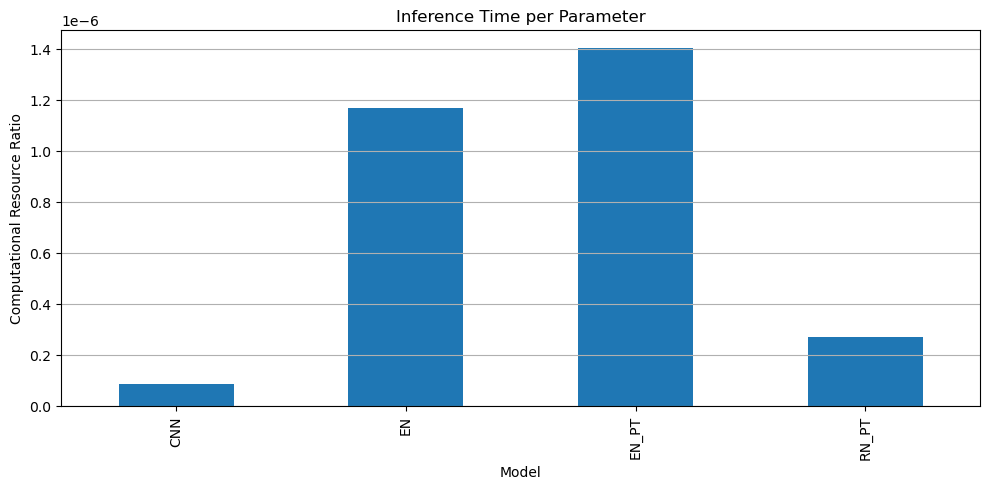

In [20]:
efficiency['Computational Resource Ratio'].plot(kind='bar', figsize=(10, 5))
plt.title('Inference Time per Parameter')
plt.ylabel('Computational Resource Ratio')
plt.xlabel('Model')
plt.grid(axis='y')

plt.tight_layout()

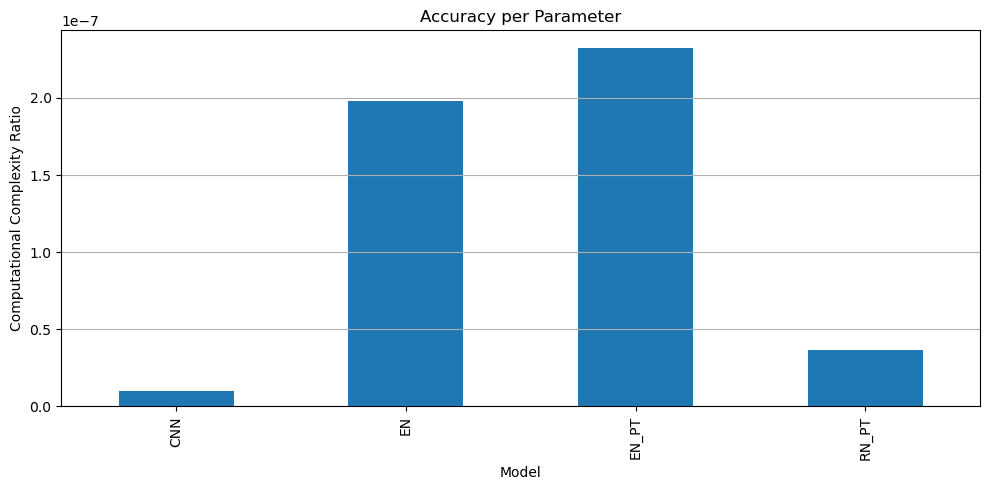

In [21]:
efficiency['Computational Complexity Ratio'].plot(kind='bar', figsize=(10, 5))
plt.title('Accuracy per Parameter')
plt.ylabel('Computational Complexity Ratio')
plt.xlabel('Model')
plt.grid(axis='y')

plt.tight_layout()

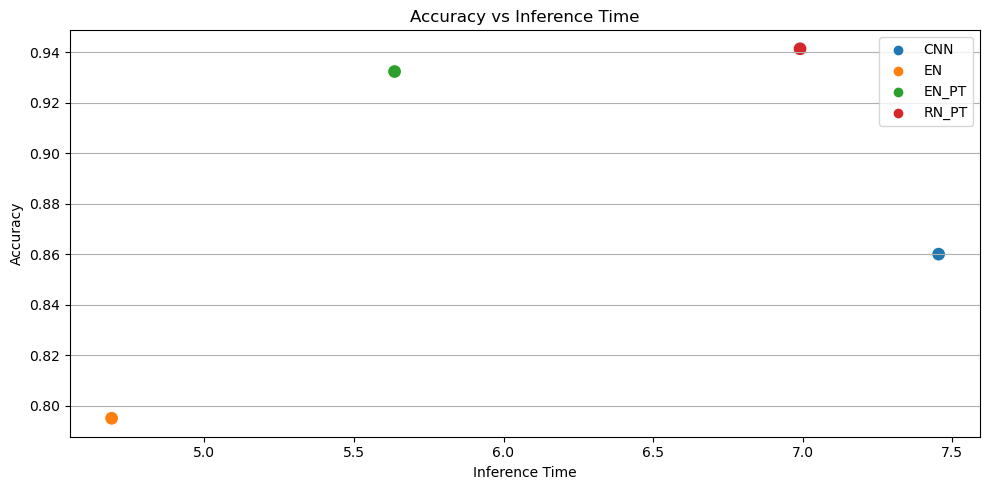

In [22]:
plt.figure(figsize=(10, 5))
sns.scatterplot(x='Inference Time', y='Accuracy', data=efficiency, hue=efficiency.index, s=100)
plt.title('Accuracy vs Inference Time')
plt.ylabel('Accuracy')
plt.xlabel('Inference Time')
plt.grid(axis='y')

plt.tight_layout()

---

### **Model Confusion**

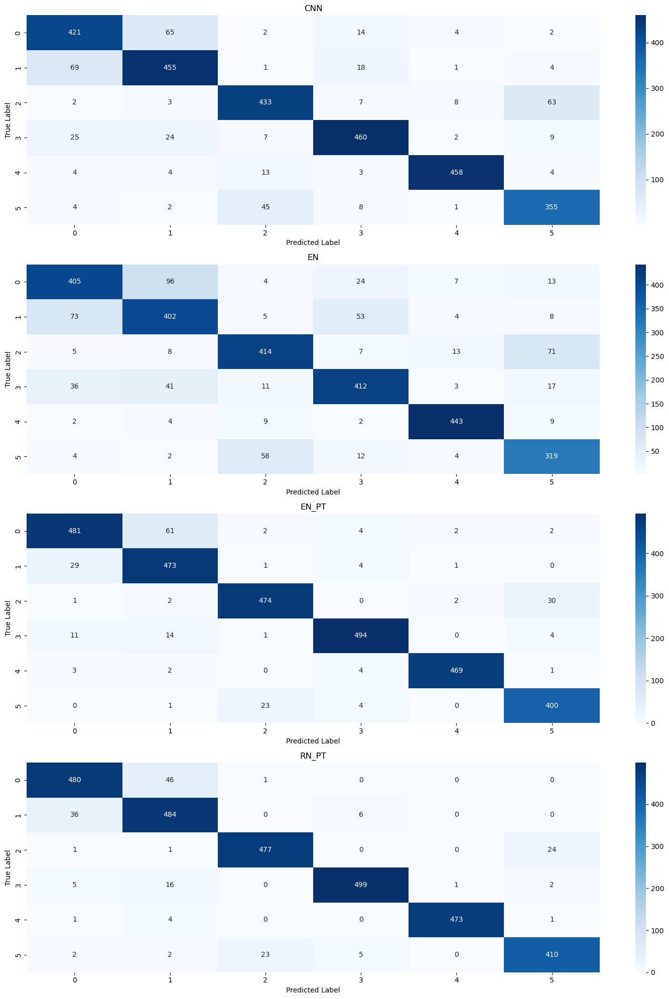

In [23]:
data = {
    'CNN': [preds['CNN'], labels['CNN']],
    'EN': [preds['EN'], labels['EN']],
    'EN_PT': [preds['EN_PT'], labels['EN_PT']],
    'RN_PT': [preds['RN_PT'], labels['RN_PT']]
}

plot_confusion_matrices(data)

---

# **Display Model Predictions and Labels**

In [24]:
category_to_int = {
    "mountain": 0,
    "glacier": 1,
    "street": 2,
    "sea": 3,
    "forest": 4,
    "buildings": 5
}
print(category_to_int)

{'mountain': 0, 'glacier': 1, 'street': 2, 'sea': 3, 'forest': 4, 'buildings': 5}


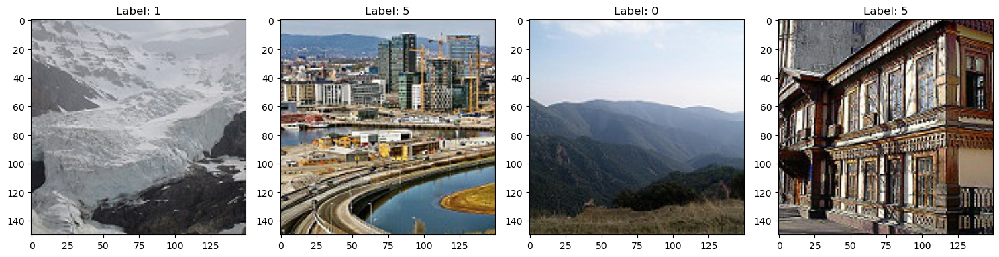

In [25]:
visualiser = ImageVisualizer(data_pipeline.test_loader)
visualiser.display_batch_images()

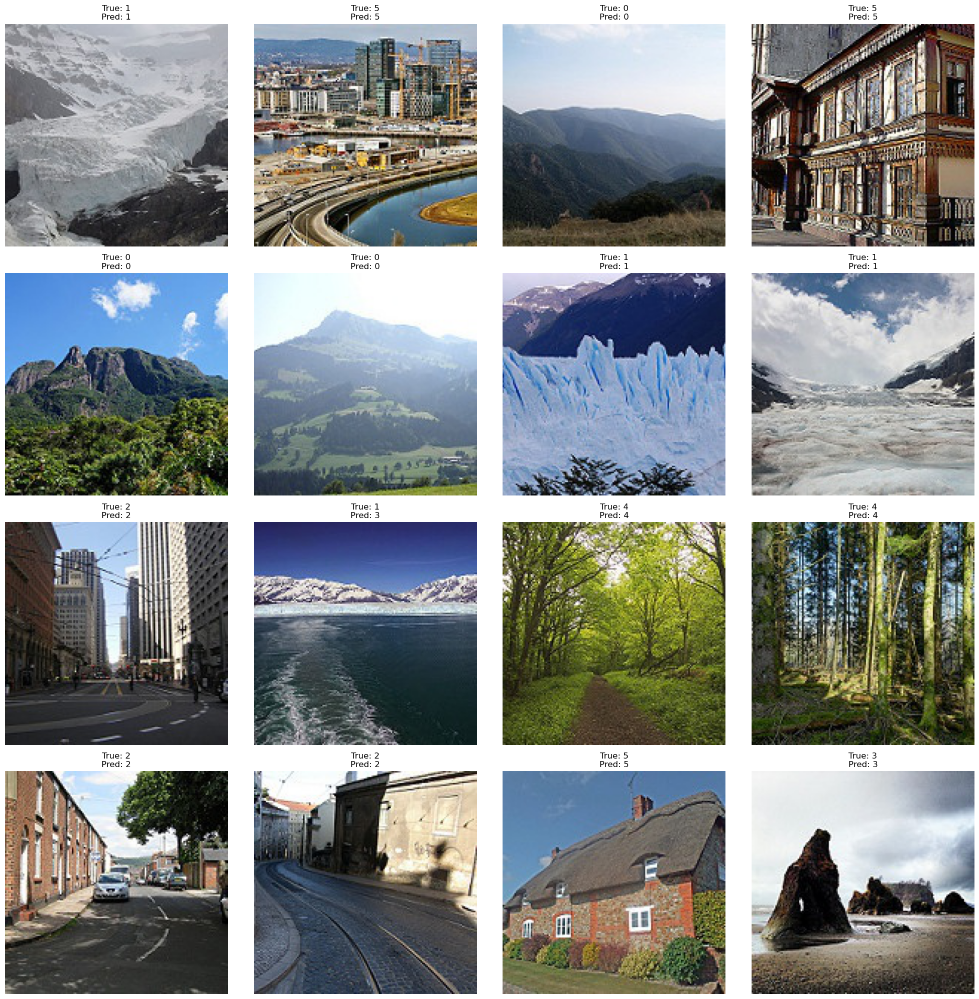

In [26]:
visualiser.display_images_with_predictions(preds['CNN'], labels['CNN'])

In [27]:
# visualiser.display_images_with_predictions(preds['EN'], labels['EN'])

In [28]:
# visualiser.display_images_with_predictions(preds['EN_PT'], labels['EN_PT'])

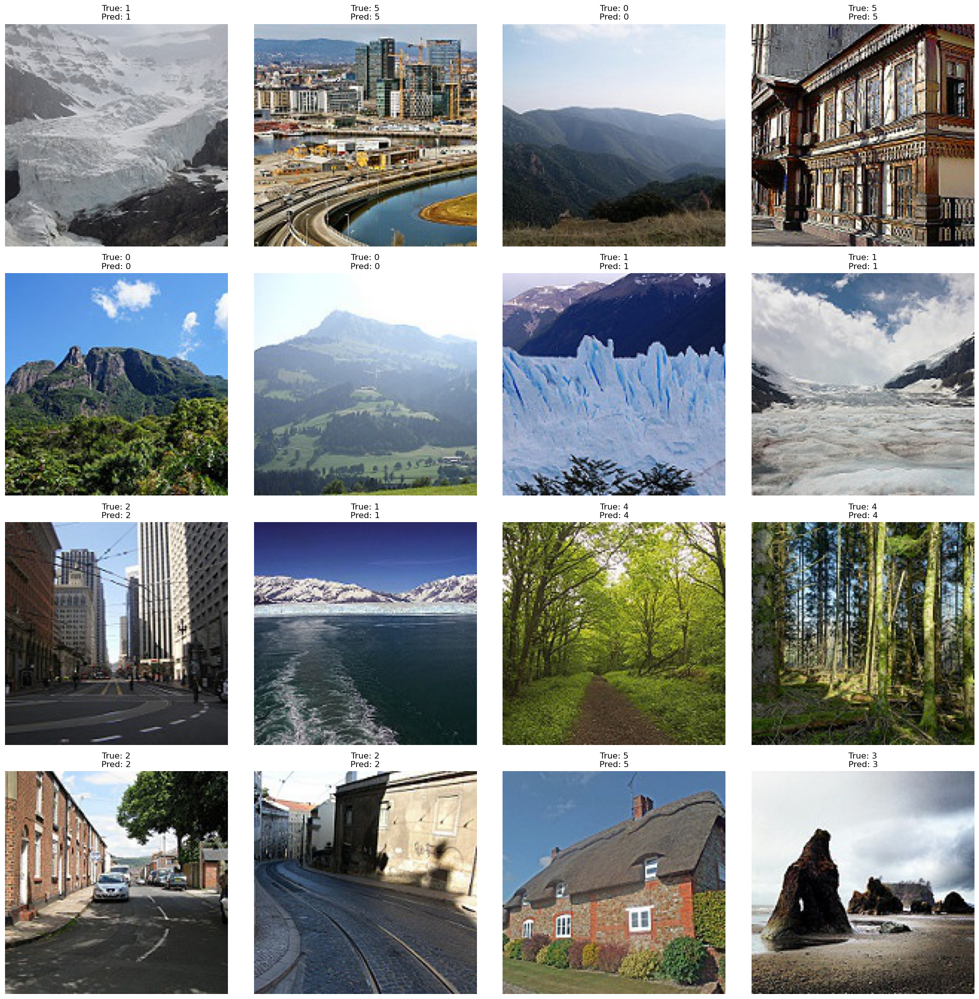

In [29]:
visualiser.display_images_with_predictions(preds['RN_PT'], labels['RN_PT'])